# Image Filtering Tutorial - Part II: Advanced Techniques

Welcome to Part II of our image processing tutorial! In this notebook, we'll explore advanced filtering techniques including edge detection, Fourier transforms, morphological operations, and image sharpening. This tutorial combines theoretical foundations with hands-on coding exercises to help you develop a deeper understanding of image processing concepts.

## Table of Contents
1. [Setting Up the Environment](#setup)
2. [Edge Detection: Theory and Practice](#edge-detection)
3. [Canny Edge Detector](#canny)
4. [Fourier Transform for Image Processing](#fourier)
5. [Morphological Operations: Erosion and Dilation](#morphology)
6. [Image Sharpening Techniques](#sharpening)

<a id="setup"></a>
## 1. Setting Up the Environment

Let's begin by importing the necessary libraries and defining some helper functions that we'll use throughout this tutorial:

In [1]:
# Core libraries for scientific computing and visualization
import numpy as np
import matplotlib.pyplot as plt
import cv2
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import LogNorm

# Configure matplotlib for inline display in Jupyter
%matplotlib inline

# Make plots larger and more readable
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 14

# Helper function to display images
def display_image(image, title="Image", cmap=None, colorbar=True, figsize=(10, 8)):
    """Display an image with proper formatting"""
    plt.figure(figsize=figsize)
    
    # Handle color vs. grayscale images
    if len(image.shape) == 3 and image.shape[2] == 3:  # Color image
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    else:  # Grayscale image
        plt.imshow(image, cmap=cmap)
    
    plt.title(title)
    plt.axis('on')
    
    if colorbar:
        plt.colorbar(shrink=0.8)
    
    plt.show()

# Helper function to display multiple images in a single row
def display_multiple(images, titles=None, cmap=None, colorbar=False, figsize=(15, 10)):
    """Display multiple images side by side"""
    n_images = len(images)
    fig, axes = plt.subplots(1, n_images, figsize=figsize)
    
    if titles is None:
        titles = ['Image ' + str(i) for i in range(1, n_images + 1)]
    
    for i, (image, title) in enumerate(zip(images, titles)):
        if n_images == 1:
            ax = axes
        else:
            ax = axes[i]
            
        # Handle color vs. grayscale images
        if len(image.shape) == 3 and image.shape[2] == 3:  # Color image
            ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        else:  # Grayscale image
            ax.imshow(image, cmap=cmap)
            
        ax.set_title(title)
        ax.axis('off')
        
        if colorbar:
            fig.colorbar(ax.imshow(image, cmap=cmap), ax=ax, shrink=0.8)
    
    plt.tight_layout()
    plt.show()


def normalize_for_display(img):
    """Normalize an image to the range 0-255 for display purposes"""
    return cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)



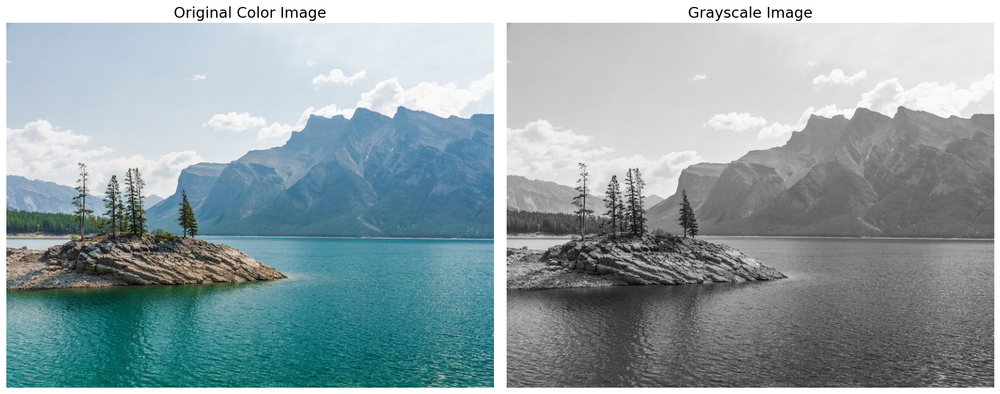

In [2]:
# Load the sample image
image_path = "images/lake.jpg"
original_image = cv2.imread(image_path)

# Create a grayscale version
gray_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)

# Display the original image and its grayscale version
display_multiple(
    [original_image, gray_image],
    ['Original Color Image', 'Grayscale Image'],
    cmap='gray',
    figsize=(16, 8)
)


<a id="edge-detection"></a>
## 2. Edge Detection: Theory and Practice

Edge detection is one of the most fundamental operations in image processing. Edges are the boundaries between different regions in an image, characterized by sharp changes in pixel intensity. Detecting these transitions is crucial for understanding image structure and is used as a preliminary step in many computer vision algorithms.

### 2.1 Mathematical Foundation of Edge Detection

Edges in an image correspond to significant local changes in intensity. Mathematically, we can identify edges by looking at the derivatives of the image intensity function $I(x,y)$:

1. **Gradient**: The first-order derivative of the image intensity, which is a vector with both magnitude and direction:
   $$\nabla I = \begin{pmatrix} \frac{\partial I}{\partial x} \\ \frac{\partial I}{\partial y} \end{pmatrix}$$

2. **Gradient Magnitude**: The strength of the edge:
   $$|\nabla I| = \sqrt{\left(\frac{\partial I}{\partial x}\right)^2 + \left(\frac{\partial I}{\partial y}\right)^2}$$

Let's visualize how edges appear in an image and its derivatives:

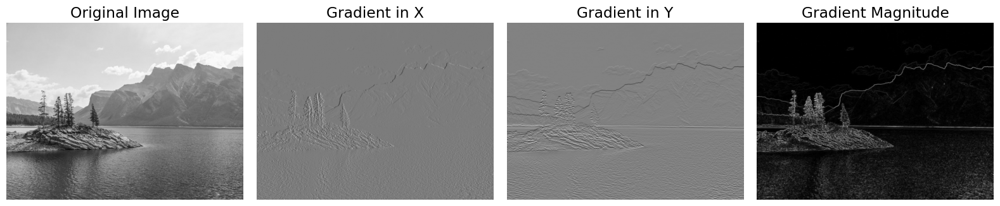

In [5]:
# Compute x and y derivatives (gradient components)
sobelx = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1, ksize=3)

# Compute gradient magnitude
magnitude = np.sqrt(sobelx**2 + sobely**2)

# Normalize for display
sobelx_norm = normalize_for_display(sobelx)
sobely_norm = normalize_for_display(sobely)
magnitude_norm = normalize_for_display(magnitude)

# Display the results
display_multiple(
    [gray_image, sobelx_norm, sobely_norm, magnitude_norm],
    ['Original Image', 'Gradient in X', 'Gradient in Y', 'Gradient Magnitude'],
    cmap='gray',
    figsize=(16, 4)
)

### 2.2 Edge Detection Operators

There are several common operators used for detecting edges in images:

1. **Sobel Operator**: Emphasizes the central pixel with a weight of 2
2. **Prewitt Operator**: Uses equal weights for all pixels
3. **Scharr Operator**: Improved version of Sobel with better rotational symmetry
4. **Laplacian Operator**: Based on the second derivative of the image

Let's compare these operators:

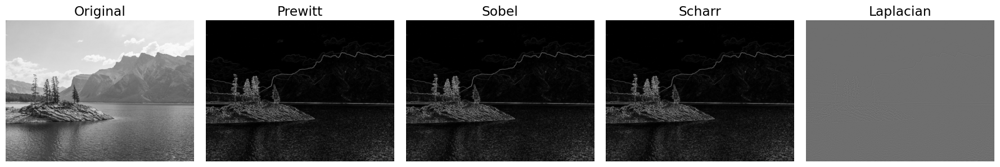

In [6]:
# Function to apply different edge detection operators
def apply_edge_operators(image):
    """Apply different edge detection operators to an image and return the results"""
    # Prewitt
    kernel_prewitt_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]], dtype=np.float32)
    kernel_prewitt_y = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]], dtype=np.float32)
    prewitt_x = cv2.filter2D(image.astype(np.float32), -1, kernel_prewitt_x)
    prewitt_y = cv2.filter2D(image.astype(np.float32), -1, kernel_prewitt_y)
    prewitt = np.sqrt(prewitt_x**2 + prewitt_y**2)
    
    # Sobel
    sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
    sobel = np.sqrt(sobel_x**2 + sobel_y**2)
    
    # Scharr
    scharr_x = cv2.Scharr(image, cv2.CV_64F, 1, 0)
    scharr_y = cv2.Scharr(image, cv2.CV_64F, 0, 1)
    scharr = np.sqrt(scharr_x**2 + scharr_y**2)
    
    # Laplacian
    laplacian = cv2.Laplacian(image, cv2.CV_64F)
    
    return {
        'prewitt': prewitt,
        'sobel': sobel,
        'scharr': scharr,
        'laplacian': laplacian
    }

# Apply the operators to our sample image
edge_results = apply_edge_operators(gray_image)

# Normalize results for display
normalized_results = {name: normalize_for_display(result) 
                     for name, result in edge_results.items()}

# Display the results
display_multiple(
    [gray_image, normalized_results['prewitt'], normalized_results['sobel'], 
     normalized_results['scharr'], normalized_results['laplacian']],
    ['Original', 'Prewitt', 'Sobel', 'Scharr', 'Laplacian'],
    cmap='gray',
    figsize=(18, 4)
)

> **Common Pitfall**: Each edge detector has different sensitivity to noise and edge detail. Laplacian is particularly sensitive to noise because it's based on second derivatives. Always consider using Gaussian smoothing before applying edge detection to reduce noise.


<a id="canny"></a>
## 3. Canny Edge Detector

The Canny edge detector is widely considered the optimal edge detection algorithm. It aims to satisfy three main criteria:

1. **Good Detection**: The algorithm should mark as many real edges as possible.
2. **Good Localization**: Marked edges should be as close as possible to the true edges.
3. **Minimal Response**: Each edge should be marked only once (no multiple responses).

### 3.1 The Canny Edge Detection Process

The Canny edge detector involves several steps:


### **3.1 The Canny Edge Detection Process Explained**

The Canny edge detection algorithm is a multi-step process designed to detect edges with precision while minimizing noise. It follows these key steps:

#### **1. Noise Reduction (Gaussian Smoothing)**
Since edge detection is sensitive to noise, the first step is to apply a Gaussian filter to smooth the image. This helps reduce unwanted high-frequency noise that could lead to false edge detection.

#### **2. Compute Gradient Magnitude and Direction**
- The image’s intensity gradients are computed using Sobel filters (or similar operators).
- This results in two gradient components: one for horizontal changes (\( G_x \)) and another for vertical changes (\( G_y \)).
- The overall gradient magnitude is calculated as:
  $$
  G = \sqrt{G_x^2 + G_y^2}
  $$
- The gradient direction (edge orientation) is given by:
  $$
  \theta = \tan^{-1} \left( \frac{G_y}{G_x} \right)
  $$

#### **3. Non-Maximum Suppression (Thinning the Edges)**
- At this stage, the goal is to remove unnecessary pixels and retain only the thinnest possible edges.
- The algorithm checks each pixel’s gradient magnitude and compares it to neighboring pixels along the gradient direction.
- Only local maxima (strongest gradient points) are retained, while others are suppressed to produce thin, well-defined edges.

#### **4. Double Thresholding (Classifying Edges)**
- The remaining pixels are categorized into:
  - **Strong edges**: Pixels with gradient magnitude above a high threshold.
  - **Weak edges**: Pixels with gradient magnitude between the high and low thresholds.
  - **Non-edges**: Pixels below the low threshold are discarded.

#### **5. Edge Tracking by Hysteresis (Finalizing Edges)**
- Weak edges that are connected to strong edges are considered real edges.
- Weak edges that are isolated are suppressed.
- This step ensures that broken or faint edges are connected properly while filtering out false edges.

Let's use OpenCV's implementation to see how Canny performs with different parameters:

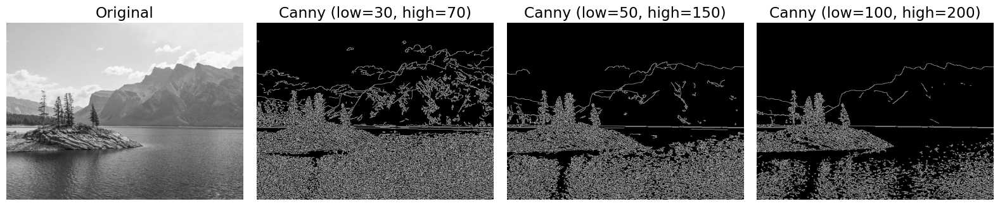

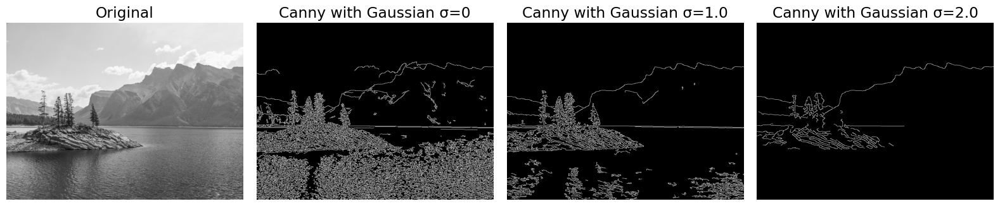

In [7]:
# Apply the Canny edge detector with different thresholds
canny_thresholds = [
    (30, 70),   # Low thresholds
    (50, 150),  # Medium thresholds
    (100, 200)  # High thresholds
]

canny_results = [cv2.Canny(gray_image, low, high) for low, high in canny_thresholds]

display_multiple(
    [gray_image] + canny_results,
    ['Original'] + [f'Canny (low={low}, high={high})' for low, high in canny_thresholds],
    cmap='gray',
    figsize=(16, 4)
)

# Effect of Gaussian blur before Canny edge detection
sigma_values = [0, 1.0, 2.0]  # 0 means no blur
canny_blurred_results = []

for sigma in sigma_values:
    if sigma == 0:
        blurred = gray_image
    else:
        blurred = cv2.GaussianBlur(gray_image, (0, 0), sigma)
    
    canny_blurred_results.append(cv2.Canny(blurred, 50, 150))

display_multiple(
    [gray_image] + canny_blurred_results,
    ['Original'] + [f'Canny with Gaussian σ={sigma}' for sigma in sigma_values],
    cmap='gray',
    figsize=(16, 4)
)

> **Common Pitfall**: 
Too low thresholds → More noise is detected as edges, leading to a cluttered result.
> 
> Too high thresholds → Weak edges are ignored, potentially missing important details.
> Threshold Ratio (High:Low)
A typical ratio between the high and low threshold is 2:1 to 3:1.
> 
> This means if the high threshold is 100, the low threshold is usually set between 33 and 50.
> This ensures weak but important edges are retained while suppressing noise.

>Optimal Threshold Selection
>In practice, thresholds depend on image contrast and noise levels.
>
>Some implementations use adaptive thresholding based on image statistics to set thresholds dynamically.
>
>So, while the 2:1 to 3:1 ratio is a common heuristic, fine-tuning is often needed for best results in specific applications.


<a id="fourier"></a>

## **4. Fourier Transform for Image Processing** 

The **Fourier Transform** is a fundamental mathematical tool that decomposes an image into its frequency components. In image processing, we use the **2D Fourier Transform** to convert an image from the **spatial domain** (pixel-based representation) to the **frequency domain** (representation based on sinusoidal components). This transformation helps analyze and manipulate the frequency content of an image, enabling tasks like filtering, compression, and pattern recognition.

### **4.1 Mathematical Foundation of the Fourier Transform** 

For a 2D discrete image $f(x,y)$ of size $M \times N$, the Discrete Fourier Transform (DFT) is defined as:


$$
F(u,v) = \frac{1}{MN} \sum_{x=0}^{M-1} \sum_{y=0}^{N-1} f(x,y) e^{-j2\pi \left(\frac{ux}{M} + \frac{vy}{N}\right)}
$$

Where:
- $f(x,y)$ is the image in the **spatial domain** (pixel values).
- $F(u,v)$ is the **Fourier transform** in the **frequency domain**.
- $(u,v)$ are the frequency coordinates corresponding to spatial coordinates $(x,y)$.
- $e^{-j2\pi \left(\frac{ux}{M} + \frac{vy}{N}\right)}$ represents the **basis functions**, which are complex exponentials (sinusoids).

This transformation expresses an image as a weighted sum of sinusoidal patterns with different frequencies and orientations.

### **4.2 Visualizing the Fourier Transform** 

Since the Fourier transform produces **complex values** (having both real and imaginary components), we typically visualize its **magnitude spectrum**, which is given by:

$$
|F(u,v)| = \sqrt{\text{Re}(F(u,v))^2 + \text{Im}(F(u,v))^2}
$$

- **Low frequencies (slow variations in intensity)** are concentrated near the center of the spectrum.
- **High frequencies (sharp edges and fine details)** are found at the periphery.
- The log transformation $\log(1 + |F(u,v)|)$ is often applied to enhance visibility.


### 4.2 Visualizing the Fourier Transform

The Fourier transform of an image is complex-valued, so we typically visualize its magnitude (spectrum):

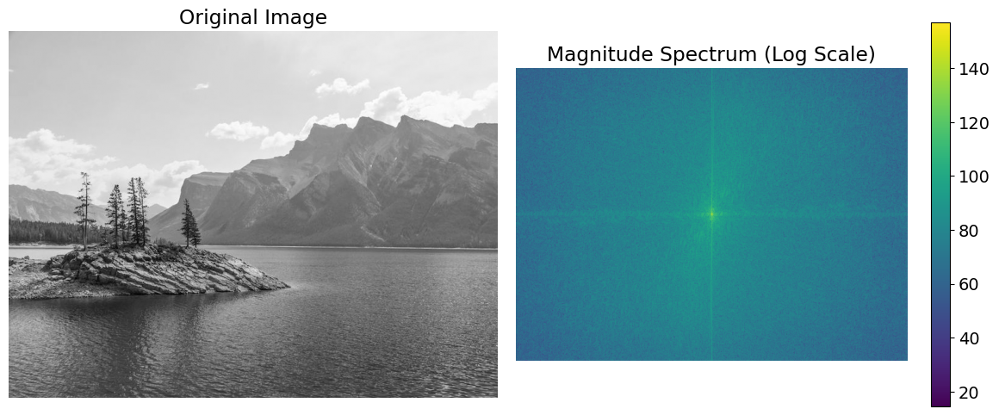

In [8]:
# Compute the 2D FFT of the image
f_transform = np.fft.fft2(gray_image)
# Shift the zero frequency component to the center
f_shift = np.fft.fftshift(f_transform)
# Compute magnitude spectrum (log scale for better visualization)
magnitude_spectrum = 20 * np.log10(np.abs(f_shift) + 1)  # Adding 1 to avoid log(0)

# Display the original image and its Fourier transform
plt.figure(figsize=(12, 6))

plt.subplot(121)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(122)
plt.imshow(magnitude_spectrum, cmap='viridis')
plt.title('Magnitude Spectrum (Log Scale)')
plt.colorbar(shrink=0.8)
plt.axis('off')

plt.tight_layout()
plt.show()


### 4.3 Frequency Domain Filtering

One of the most powerful applications of the Fourier transform is frequency domain filtering. We can modify specific frequency components and then transform back to the spatial domain.

Let's implement:
1. Low-pass filter (blurs the image by removing high frequencies)
2. High-pass filter (enhances edges by removing low frequencies)

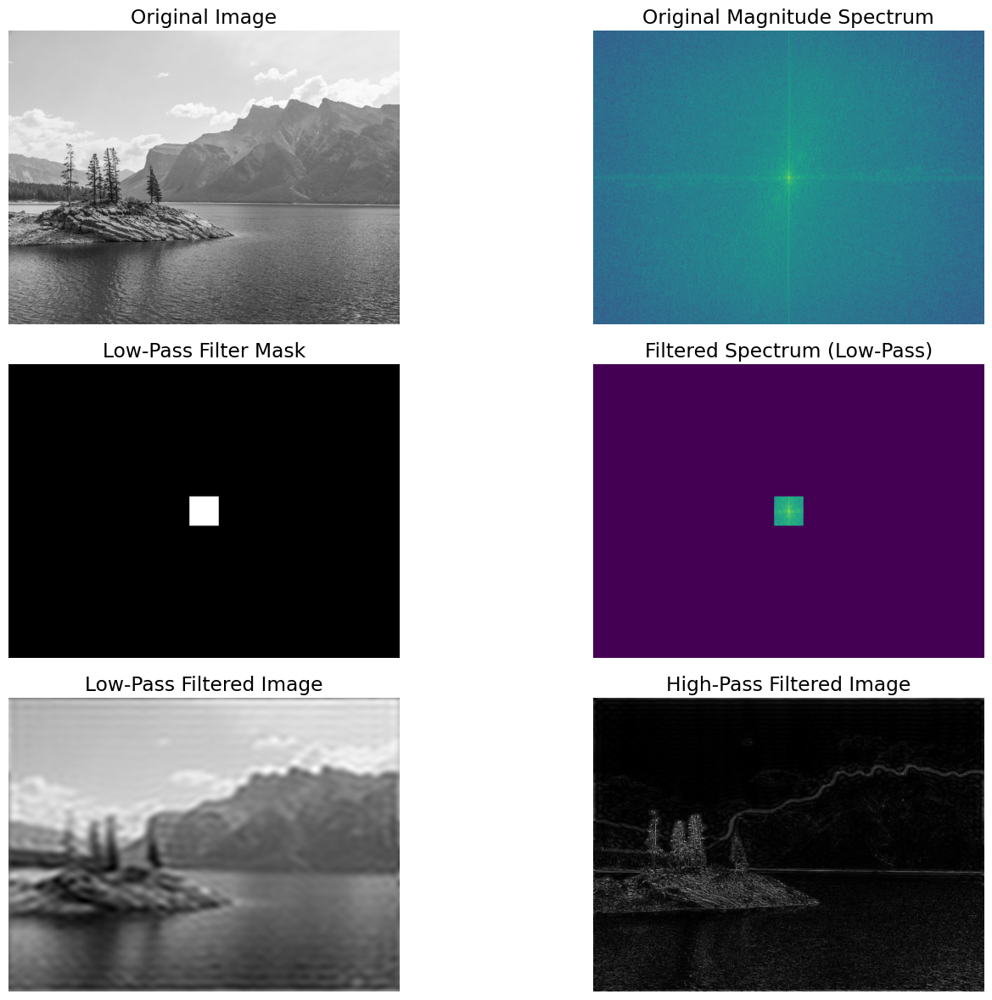

In [9]:
def frequency_domain_filtering(image, filter_type, cutoff=30):
    """Apply frequency domain filtering to an image"""
    # Compute the 2D FFT of the image
    f_transform = np.fft.fft2(image)
    f_shift = np.fft.fftshift(f_transform)
    
    # Get the dimensions of the image
    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2
    
    # Create a mask with the desired filter shape
    mask = np.ones((rows, cols), np.uint8)
    
    if filter_type == 'low_pass':
        # Create a circular low-pass filter
        mask[crow-cutoff:crow+cutoff, ccol-cutoff:ccol+cutoff] = 0
        # Invert the mask for low-pass
        mask = 1 - mask
    elif filter_type == 'high_pass':
        # Create a circular high-pass filter
        mask[crow-cutoff:crow+cutoff, ccol-cutoff:ccol+cutoff] = 0
    
    # Apply the mask to the Fourier transform
    f_shift_filtered = f_shift * mask
    
    # Compute the inverse FFT to get back to the spatial domain
    f_ishift = np.fft.ifftshift(f_shift_filtered)
    img_back = np.fft.ifft2(f_ishift)
    img_filtered = np.abs(img_back)
    
    return {
        'filtered_image': img_filtered,
        'magnitude_spectrum': 20 * np.log10(np.abs(f_shift) + 1),
        'filtered_spectrum': 20 * np.log10(np.abs(f_shift_filtered) + 1),
        'mask': mask * 255
    }

# Apply low-pass and high-pass filtering
low_pass_results = frequency_domain_filtering(gray_image, 'low_pass', cutoff=30)
high_pass_results = frequency_domain_filtering(gray_image, 'high_pass', cutoff=30)

# Display results
plt.figure(figsize=(16, 12))

# Original image and its spectrum
plt.subplot(3, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(3, 2, 2)
plt.imshow(low_pass_results['magnitude_spectrum'], cmap='viridis')
plt.title('Original Magnitude Spectrum')
plt.axis('off')

# Low-pass filter results
plt.subplot(3, 2, 3)
plt.imshow(low_pass_results['mask'], cmap='gray')
plt.title('Low-Pass Filter Mask')
plt.axis('off')

plt.subplot(3, 2, 4)
plt.imshow(low_pass_results['filtered_spectrum'], cmap='viridis')
plt.title('Filtered Spectrum (Low-Pass)')
plt.axis('off')

# High-pass filter results
plt.subplot(3, 2, 5)
plt.imshow(normalize_for_display(low_pass_results['filtered_image']), cmap='gray')
plt.title('Low-Pass Filtered Image')
plt.axis('off')

plt.subplot(3, 2, 6)
plt.imshow(normalize_for_display(high_pass_results['filtered_image']), cmap='gray')
plt.title('High-Pass Filtered Image')
plt.axis('off')

plt.tight_layout()
plt.show()

<a id="morphology"></a>
## 5. Morphological Operations: Erosion and Dilation

Morphological operations are a set of **non-linear** image processing techniques used to analyze and process the **shape** of objects in an image. These operations are typically applied to **binary images**, but they can also be extended to **grayscale images**.

Morphological transformations involve a **structuring element (kernel)** that interacts with an image using set operations like **intersection, union, and complement**. The two fundamental morphological operations are **erosion** and **dilation**.

---

### 5.1 Erosion

Erosion **shrinks** or **thins** objects in an image by removing boundary pixels. It is useful for:
- **Removing noise** (small white dots in a binary image)
- **Separating touching objects**
- **Reducing object size** while preserving its general shape

#### Mathematical Definition

For a **binary image** $A$ and a **structuring element** $B$, erosion is defined as:

$$A \ominus B = \{z \in E \ | \ B_z \subseteq A\}$$

Where:
- $B_z$ is the translation of $B$ by the vector $z$
- A pixel in the **output image** is set to **1** if **all** pixels under the kernel are **1** in the input image; otherwise, it is set to **0**

#### Intuition

Think of erosion as a filter that removes pixels **where the structuring element does not fully fit** inside the foreground object. This leads to a **shrinking effect**.

---

### 5.2 Dilation

Dilation **expands** or **thickens** objects in an image by adding pixels to their boundaries. It is useful for:
- **Bridging small gaps** between objects
- **Filling small holes** in objects
- **Enhancing structures** by making them more prominent

#### Mathematical Definition

For a **binary image** $A$ and a **structuring element** $B$, dilation is defined as:

$$A \oplus B = \{z \in E \ | \ (B_s)_z \cap A \neq \emptyset\}$$

Where:
- A pixel in the **output image** is set to **1** if **at least one** pixel under the kernel is **1** in the input image

#### Intuition

Dilation **grows** objects by adding pixels **where the structuring element overlaps** with at least one foreground pixel. This results in a **thickening effect**.

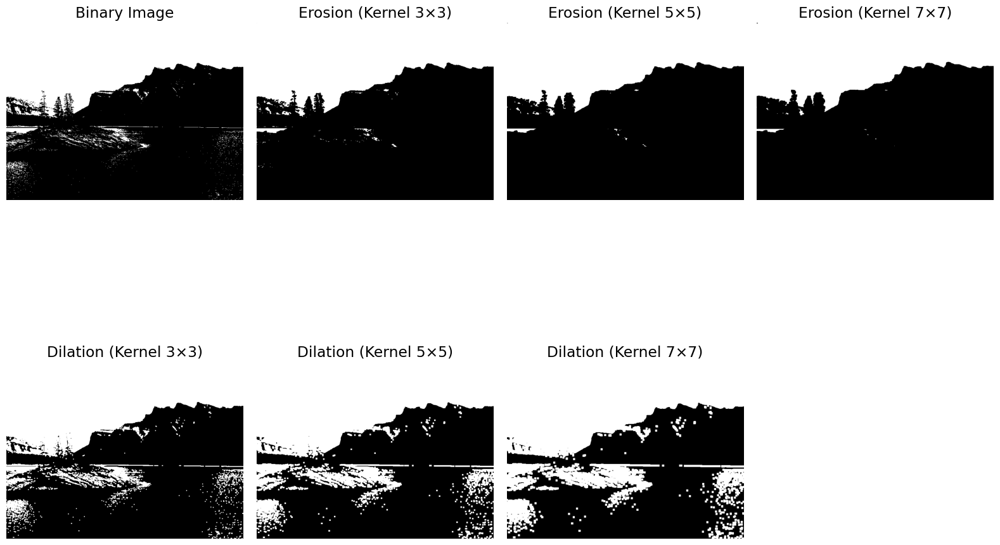

In [11]:
# Create a binary image using thresholding
_, binary_image = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Define different structuring elements (kernels)
kernel_sizes = [3, 5, 7]
kernels = [np.ones((k, k), np.uint8) for k in kernel_sizes]

# Apply erosion and dilation with different kernel sizes
eroded_images = [cv2.erode(binary_image, kernel, iterations=1) for kernel in kernels]
dilated_images = [cv2.dilate(binary_image, kernel, iterations=1) for kernel in kernels]

# Display the results
plt.figure(figsize=(16, 12))

# Original binary image
plt.subplot(2, 4, 1)
plt.imshow(binary_image, cmap='gray')
plt.title('Binary Image')
plt.axis('off')

# Eroded images
for i, (size, eroded) in enumerate(zip(kernel_sizes, eroded_images)):
    plt.subplot(2, 4, i+2)
    plt.imshow(eroded, cmap='gray')
    plt.title(f'Erosion (Kernel {size}×{size})')
    plt.axis('off')

# Dilated images
for i, (size, dilated) in enumerate(zip(kernel_sizes, dilated_images)):
    plt.subplot(2, 4, i+5)
    plt.imshow(dilated, cmap='gray')
    plt.title(f'Dilation (Kernel {size}×{size})')
    plt.axis('off')

plt.tight_layout()
plt.show()

<a id="morphology"></a>
## 5. Morphological Operations: Erosion and Dilation

Morphological operations are powerful techniques for processing binary and grayscale images based on shapes. These non-linear operations use a **structuring element** (a small shape or template) to interact with an image in ways that can enhance or remove features based on their morphology (shape and structure).

### 5.1 Erosion: Shrinking Objects

Erosion is one of the two fundamental morphological operations. As the name suggests, erosion "erodes" or shrinks the boundaries of foreground objects (typically white pixels in a binary image).

#### How Erosion Works

The mathematical definition of erosion for a binary image $A$ with a structuring element $B$ is:

$$A \ominus B = \{z \in E \mid B_z \subseteq A\}$$

This formal definition might seem complex, but the practical mechanism is more intuitive:

1. The structuring element $B$ "slides" across the image (like a convolution kernel)
2. For each pixel position, we examine all pixels covered by the structuring element
3. If **ALL** pixels under the structuring element are 1 (white) in the original image, the output pixel is set to 1
4. If **ANY** pixel under the structuring element is 0 (black), the output pixel is set to 0

In simpler terms, a pixel in the output image stays white only if all the corresponding pixels in the input image covered by the structuring element are white.

#### Simple Example with Dummy Data

Let's visualize erosion with a simple 6×6 binary image and a 3×3 structuring element:

**Original Binary Image:**
```
1 1 1 0 0 0
1 1 1 0 0 0
1 1 1 1 1 0
1 1 1 1 1 0
1 1 1 1 1 0
0 0 0 0 0 0
```

**Structuring Element (3×3 square):**
```
1 1 1
1 1 1
1 1 1
```

**Erosion Process Step-by-Step:**

Let's consider the pixel at position (2,2) in our image (third row, third column, with value 1):

1. We center our 3×3 structuring element at position (2,2)
2. This covers the pixels from positions (1,1) to (3,3)
3. All of these pixels have value 1, so the output pixel at (2,2) remains 1

Now let's look at position (2,3) (third row, fourth column, with value 1):

1. We center our 3×3 structuring element at position (2,3)
2. This covers some pixels with value 0 (in the top-right)
3. Since not all covered pixels are 1, the output pixel at (2,3) becomes 0

After processing all pixels, the eroded image would be:
```
0 0 0 0 0 0
0 1 0 0 0 0
0 0 0 0 0 0
0 0 0 0 0 0
0 0 0 0 0 0
0 0 0 0 0 0
```

Notice how the boundaries have been eroded and only the "core" of the object remains.

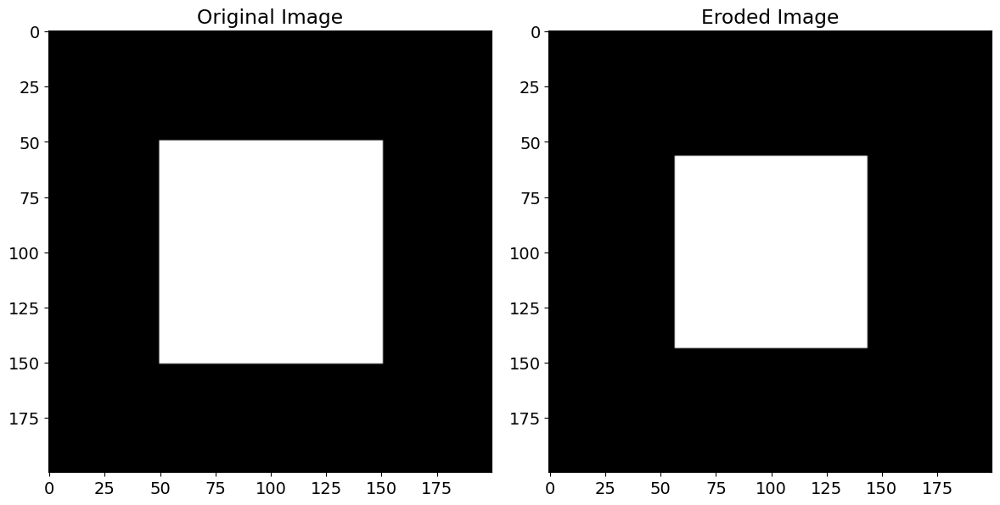

In [12]:
# Create a simple binary image
binary_image = np.zeros((200, 200), dtype=np.uint8)
cv2.rectangle(binary_image, (50, 50), (150, 150), 255, -1)  # Draw a white square

# Define structuring element (kernel)
kernel = np.ones((15, 15), np.uint8)  # 15×15 square kernel

# Apply erosion
eroded_image = cv2.erode(binary_image, kernel, iterations=1)

# Display the result
plt.figure(figsize=(12, 6))
plt.subplot(121), plt.imshow(binary_image, cmap='gray'), plt.title('Original Image')
plt.subplot(122), plt.imshow(eroded_image, cmap='gray'), plt.title('Eroded Image')
plt.tight_layout()
plt.show()

#### Applications of Erosion

- Removing small white noise (salt noise)
- Separating connected objects
- Shrinking features
- Finding certain morphological skeletons



### 5.2 Dilation: Expanding Objects

Dilation is the complementary operation to erosion. It "dilates" or expands the boundaries of foreground objects.

#### How Dilation Works

The mathematical definition of dilation for a binary image $A$ with a structuring element $B$ is:

$$A \oplus B = \{z \in E \mid (B_s)_z \cap A \neq \emptyset\}$$

Where $(B_s)_z$ is the reflection of $B$ about its origin, translated by $z$.

The practical mechanism of dilation is:

1. The structuring element $B$ "slides" across the image (like a convolution kernel)
2. For each pixel position, we examine all pixels covered by the structuring element
3. If **ANY** pixel under the structuring element is 1 (white) in the original image, the output pixel is set to 1
4. Only if **ALL** pixels under the structuring element are 0 (black), the output pixel is set to 0

In simpler terms, a pixel in the output image becomes white if at least one of the corresponding pixels in the input image covered by the structuring element is white.

#### Simple Example with Dummy Data

Let's visualize dilation with a simple 6×6 binary image and a 3×3 structuring element:

**Original Binary Image:**
```
0 0 0 0 0 0
0 0 0 0 0 0
0 0 1 0 0 0
0 0 0 0 0 0
0 0 0 0 0 0
0 0 0 0 0 0
```

**Structuring Element (3×3 square):**
```
1 1 1
1 1 1
1 1 1
```

**Dilation Process Step-by-Step:**

Let's consider the pixel at position (2,2) (the single white pixel):

1. For each position where the structuring element overlaps with this white pixel, the output will have a white pixel
2. Since our structuring element is 3×3, it will create a 3×3 area of white pixels centered around the original white pixel

After processing, the dilated image will be:
```
0 0 0 0 0 0
0 1 1 1 0 0
0 1 1 1 0 0
0 1 1 1 0 0
0 0 0 0 0 0
0 0 0 0 0 0
```

The single pixel has been expanded to a 3×3 square, illustrating how dilation grows objects.

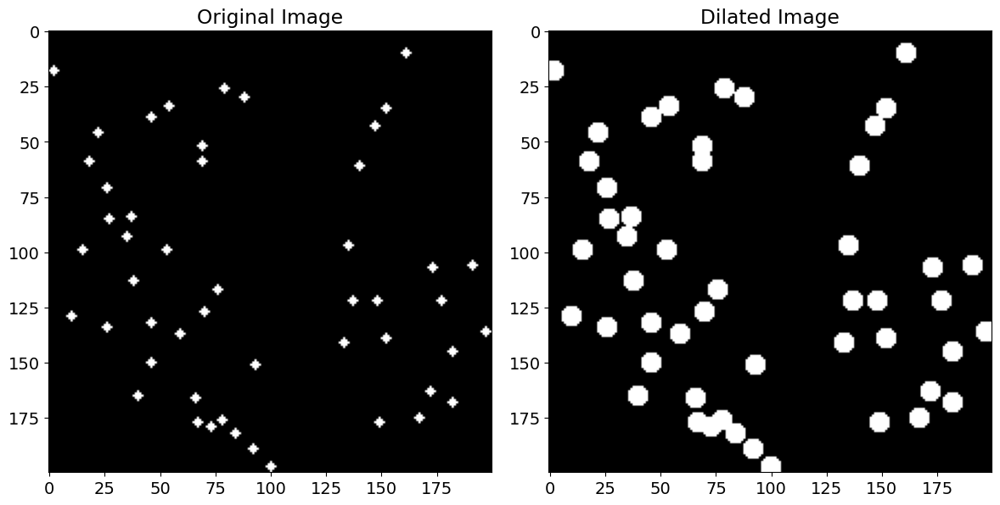

In [13]:
# Create a simple binary image with small objects
binary_image = np.zeros((200, 200), dtype=np.uint8)
# Add some small white dots
for _ in range(50):
    x, y = np.random.randint(0, 200, 2)
    cv2.circle(binary_image, (x, y), 2, 255, -1)

# Define structuring element (kernel)
kernel = np.ones((5, 5), np.uint8)  # 5×5 square kernel

# Apply dilation
dilated_image = cv2.dilate(binary_image, kernel, iterations=1)

# Display the result
plt.figure(figsize=(12, 6))
plt.subplot(121), plt.imshow(binary_image, cmap='gray'), plt.title('Original Image')
plt.subplot(122), plt.imshow(dilated_image, cmap='gray'), plt.title('Dilated Image')
plt.tight_layout()
plt.show()

#### The Effect of Different Structuring Elements

The shape and size of the structuring element significantly impact the morphological operation:

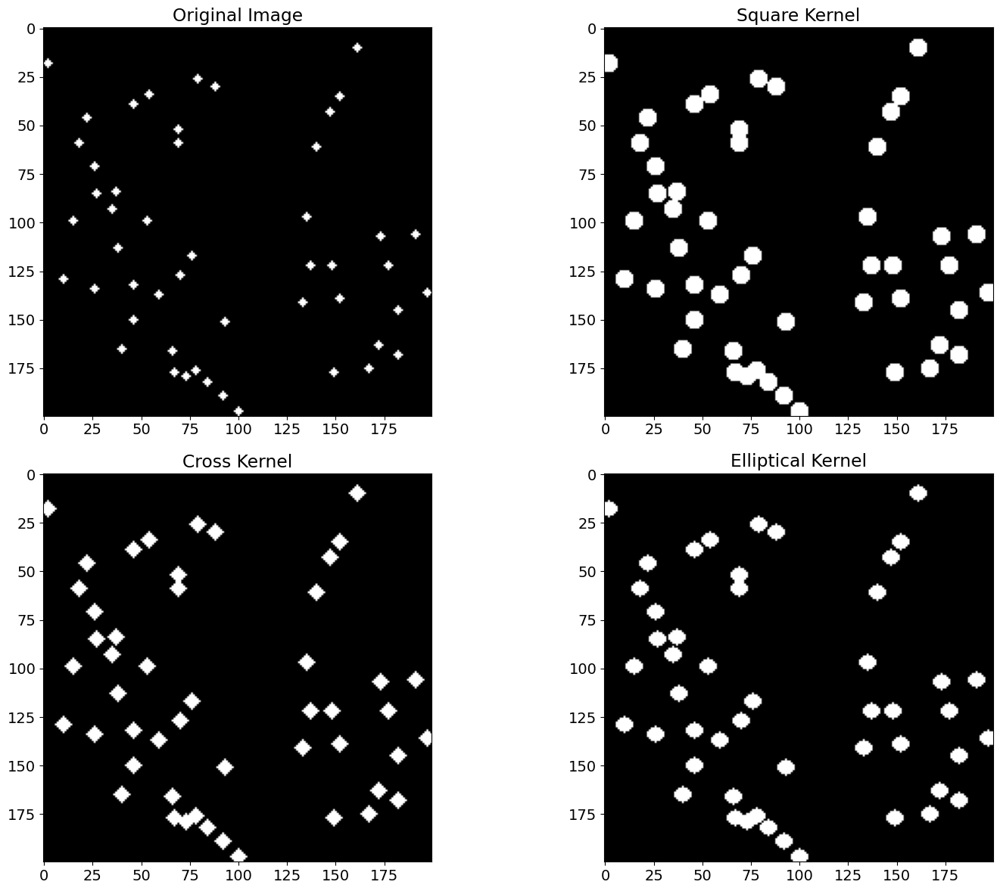

In [14]:
# Create different structuring elements
square_kernel = np.ones((5, 5), np.uint8)  # Square
cross_kernel = np.zeros((5, 5), np.uint8)  # Cross
cross_kernel[2, :] = 1
cross_kernel[:, 2] = 1
elliptical_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))  # Ellipse

# Apply dilation with different kernels
dilated_square = cv2.dilate(binary_image, square_kernel)
dilated_cross = cv2.dilate(binary_image, cross_kernel)
dilated_ellipse = cv2.dilate(binary_image, elliptical_kernel)

# Display the results
plt.figure(figsize=(16, 12))
plt.subplot(221), plt.imshow(binary_image, cmap='gray'), plt.title('Original Image')
plt.subplot(222), plt.imshow(dilated_square, cmap='gray'), plt.title('Square Kernel')
plt.subplot(223), plt.imshow(dilated_cross, cmap='gray'), plt.title('Cross Kernel')
plt.subplot(224), plt.imshow(dilated_ellipse, cmap='gray'), plt.title('Elliptical Kernel')
plt.tight_layout()
plt.show()

#### Applications of Dilation

- Filling in small holes in objects
- Joining broken parts of objects
- Growing features
- Removing pepper noise (small black pixels)
- Finding the convex hull of an object

---

### 5.3 Compound Morphological Operations

Erosion and dilation are often combined to create more complex operations:

1. **Opening**: Erosion followed by dilation (removes small objects and noise)
   ```python
   opening = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)
   ```

2. **Closing**: Dilation followed by erosion (fills small holes and gaps)
   ```python
   closing = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)
   ```




### **Why Use Compound Morphological Operations?**

While **erosion and dilation** are useful on their own, combining them allows us to **target specific noise structures and shape modifications** in a more refined way. **Opening and closing** are two fundamental **compound morphological operations** that help with **noise removal, shape smoothing, and structure enhancement**.

---

### **1. Opening (Erosion → Dilation)**
$$
A \circ B = (A \ominus B) \oplus B
$$

**Purpose:**  
- **Removes small noise (isolated white pixels or specks)**
- **Preserves larger objects** in the image
- **Smooths object boundaries** by eliminating small protrusions

**How It Works:**  
1. **Erosion removes small noise** but also slightly shrinks larger objects.
2. **Dilation restores the shape** of the remaining objects, ensuring that meaningful structures are not lost.

📌 **Example Use Cases:**
- Removing salt noise (random white pixels) in a binary image.
- Cleaning up scanned documents where small ink spots exist.
- Segmenting objects where small, thin connections should be removed.

---

### **2. Closing (Dilation → Erosion)**
$$
A \bullet B = (A \oplus B) \ominus B
$$

**Purpose:**  
- **Fills small holes (isolated black pixels in white regions)**
- **Joins disconnected structures** (e.g., broken lines)
- **Smooths boundaries** by filling small gaps

**How It Works:**  
1. **Dilation expands objects** to fill gaps or connect nearby components.
2. **Erosion removes excess expansion**, restoring the original shape but keeping the gaps filled.

📌 **Example Use Cases:**
- Filling gaps in a fingerprint scan where ridges are broken.
- Enhancing text in OCR preprocessing by connecting broken letters.
- Closing gaps in segmented objects, ensuring continuity.

---

### **Why This Matters in Practice**
- **Image Preprocessing:** Before edge detection, opening and closing help remove noise and ensure clean object boundaries.
- **Medical Imaging:** Useful in MRI and X-ray analysis to remove noise or connect fragmented structures.
- **Document Scanning:** Enhances character recognition by ensuring letters are not broken.

### 5.4 Morphological Gradient

The morphological gradient is the difference between the dilation and the erosion of an image:

$$\text{Gradient}(A) = (A \oplus B) - (A \ominus B)$$

It highlights the boundaries of objects. 

### **Why is the Morphological Gradient Important?**

"Which pixels change status when the objects in the image grow or shrink?"


### **Key Benefits of the Morphological Gradient**
1. **Emphasizes Object Boundaries**  
   - Since dilation expands objects and erosion shrinks them, the difference between them produces a **boundary outline** of the object.  
   - This is useful for detecting shapes and contours.

2. **Less Sensitive to Noise**  
   - Unlike intensity-based edge detectors, morphological operations work directly on shapes, making them more robust to **illumination variations**.

3. **Helps in Feature Extraction**  
   - The gradient helps isolate meaningful structures in medical imaging (e.g., highlighting tumors, detecting cell boundaries).
   - Useful in character recognition (OCR) by enhancing text boundaries.

4. **Preprocessing for Further Analysis**  
   - In object segmentation, it refines edges before applying contour detection or watershed segmentation.





### **The Core Philosophical Difference**  
Traditional edge detectors like **Sobel** and **Canny** operate on the principle that edges are defined by **sharp changes in pixel intensity**. These methods detect edges by analyzing how brightness values transition from one pixel to the next.  

In contrast, the **morphological gradient** identifies boundaries based on **structural transformations** rather than intensity changes. It detects edges by observing how an object's shape **expands and contracts** under morphological operations like **dilation and erosion**.

#### **Intuitive Analogy: The Edge of a Forest**
Imagine trying to find the boundary of a forest:
- **Sobel/Canny** would detect the **edge based on light intensity**—for example, looking for the transition from a bright open field to the darker forest interior.
- **Morphological Gradient** would detect the **edge based on structure**—by **expanding and shrinking the forest**, and marking areas where changes occur.

### **How Sobel Works: Intensity Differentiation**
The **Sobel operator** estimates how quickly pixel intensity changes across an image by approximating the **first derivative** of the intensity function.

1. Applies two **3×3 convolution kernels** to compute intensity derivatives in the **horizontal (Gx) and vertical (Gy) directions**.
2. Computes the **gradient magnitude** at each pixel:
   $$
   G = \sqrt{G_x^2 + G_y^2}
   $$
3. Marks edges where the gradient magnitude **exceeds a threshold**.

#### **Intuition: Image as a 3D Terrain**
If we visualize an image as a **3D landscape** where **height corresponds to pixel intensity**, Sobel **detects the steepest slopes**—areas where intensity changes abruptly, like cliffs or ridges.

📌 **Best for:** Quick edge detection in grayscale images, useful in detecting general structures but sensitive to noise.

---

### **How Canny Works: Smarter Intensity-Based Edge Detection**
The **Canny edge detector** builds upon Sobel, adding additional steps to improve accuracy and remove noise:

1. **Gaussian Smoothing** – Blurs the image to reduce noise.  
2. **Gradient Computation** – Uses **Sobel-like** derivatives to detect intensity changes.  
3. **Non-Maximum Suppression** – Keeps only the most significant edges, thinning them to single-pixel lines.  
4. **Hysteresis Thresholding** – Applies two thresholds to classify edges as **strong, weak, or non-existent**, ensuring better continuity.

📌 **Best for:** Finding **precise, thin, and well-connected edges** while reducing noise.

---

### **How Morphological Gradient Works: Structure-Based Edge Detection**
The **morphological gradient** takes an entirely different approach:

1. **Dilation expands objects**—pushing boundaries outward.  
2. **Erosion shrinks objects**—pulling boundaries inward.  
3. **The difference between the two** highlights the regions affected by these transformations—**the object boundaries**.

$$
\text{Gradient}(A) = (A \oplus B) - (A \ominus B)
$$

#### **Why is this different?**
Instead of relying on brightness changes, **morphological gradient detects edges based on shape transformations**. This makes it:
- **More robust to noise and lighting variations** than Sobel/Canny.
- **Better suited for detecting object boundaries in binary images**.
- **Insensitive to gradual intensity variations**, making it ideal for segmentation tasks.

📌 **Best for:** Object segmentation, structure analysis, and feature extraction in **binary** images.

---

### **Key Differences Summary**
| Method | Works On | Detects | Sensitive to Noise? | Best For |
|--------|---------|---------|--------------------|----------|
| **Sobel** | Grayscale | General edges, textures | High | Quick edge detection |
| **Canny** | Grayscale | Thin, connected edges | Moderate | High-precision edge detection |
| **Morphological Gradient** | Binary, Grayscale | Object boundaries | Low | Shape-based feature extraction |

---

- If you need **sharp, detailed edges** → Use **Canny**. (Recall Sobel is a part of Canny) 
- If you need **fast, simple edge detection** → Use **Sobel**.  
- If you need **shape-based boundary detection** (e.g., for segmentation) → Use the **Morphological Gradient**.  

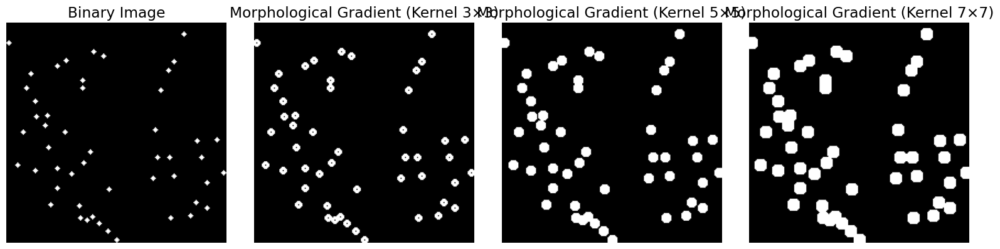

In [15]:
# Apply morphological gradient with different kernel sizes
gradients = [cv2.morphologyEx(binary_image, cv2.MORPH_GRADIENT, kernel) for kernel in kernels]

# Display the results
plt.figure(figsize=(16, 4))

# Original binary image
plt.subplot(1, 4, 1)
plt.imshow(binary_image, cmap='gray')
plt.title('Binary Image')
plt.axis('off')

# Gradient results
for i, (size, gradient) in enumerate(zip(kernel_sizes, gradients)):
    plt.subplot(1, 4, i+2)
    plt.imshow(gradient, cmap='gray')
    plt.title(f'Morphological Gradient (Kernel {size}×{size})')
    plt.axis('off')

plt.tight_layout()
plt.show()

> **Common Pitfall**: The choice of structuring element (kernel) size and shape significantly affects the result of morphological operations. Too large a kernel can remove important details, while too small a kernel might not remove enough noise.

<a id="sharpening"></a>
## 6. Image Sharpening Techniques

Image sharpening enhances the edges in an image by emphasizing the transitions between different regions. Several techniques can be used for sharpening, including:

1. **Unsharp masking**: Subtracting a blurred version of the image from the original
2. **High-boost filtering**: A generalization of unsharp masking
3. **Laplacian sharpening**: Using the Laplacian operator to enhance

### 6.1 Unsharp Masking

Unsharp masking is a classic sharpening technique:

1. Create a blurred (unsharp) version of the original image
2. Subtract the blurred image from the original
3. Add the resulting "mask" back to the original

Mathematically:
$$g(x,y) = f(x,y) + k \cdot [f(x,y) - f_{blur}(x,y)]$$

Where:
- $f(x,y)$ is the original image
- $f_{blur}(x,y)$ is the blurred image
- $k$ is a scaling factor that controls the amount of sharpening
- $g(x,y)$ is the sharpened image

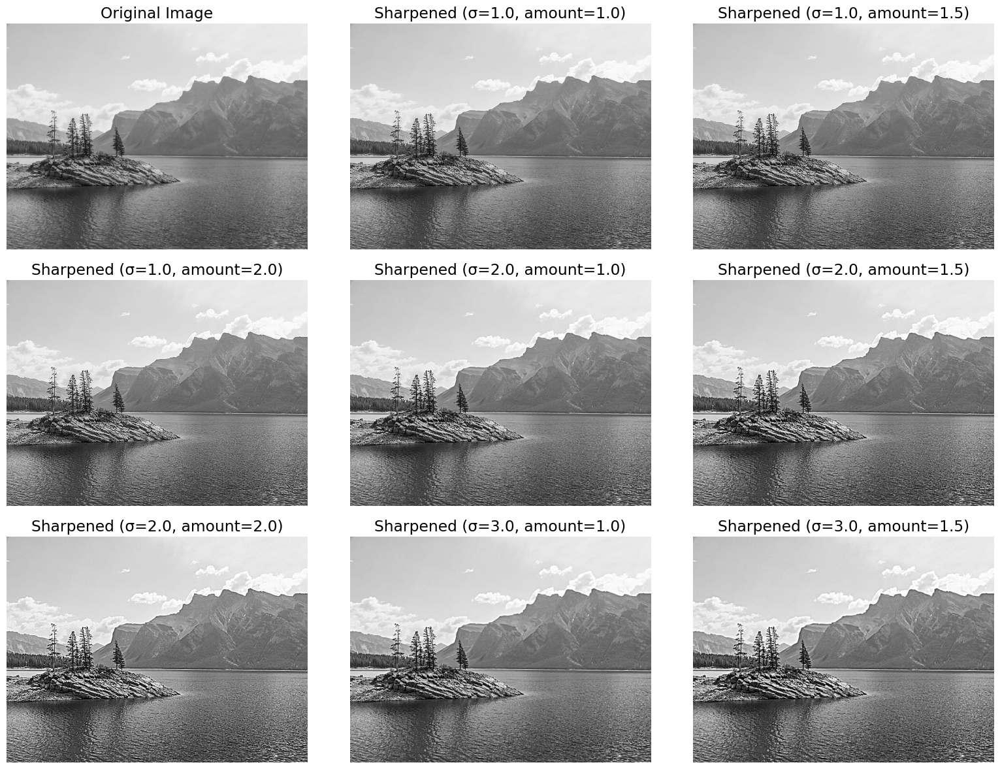

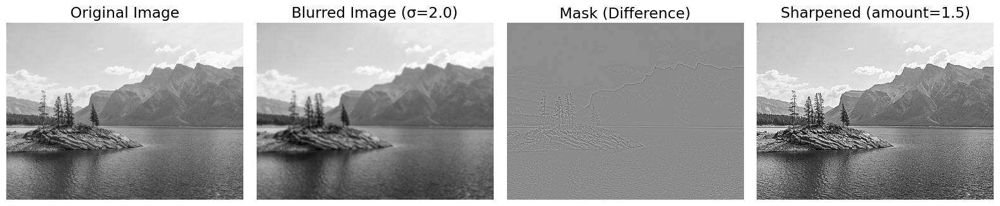

In [16]:
def unsharp_masking(image, sigma=1.0, amount=1.0):
    """Apply unsharp masking to an image"""
    # Create the blurred version of the image
    blurred = cv2.GaussianBlur(image, (0, 0), sigma)
    
    # Compute the mask by subtracting the blurred image from the original
    mask = image.astype(np.float32) - blurred.astype(np.float32)
    
    # Add the scaled mask to the original image
    sharpened = image.astype(np.float32) + amount * mask
    
    # Clip values to the valid range
    sharpened = np.clip(sharpened, 0, 255).astype(np.uint8)
    
    return sharpened, blurred, mask

# Apply unsharp masking with different parameters
sigma_values = [1.0, 2.0, 3.0]
amount_values = [1.0, 1.5, 2.0]

sharpened_images = []
for sigma in sigma_values:
    for amount in amount_values:
        sharpened, _, _ = unsharp_masking(gray_image, sigma=sigma, amount=amount)
        sharpened_images.append((sigma, amount, sharpened))

# Display a selection of results
plt.figure(figsize=(16, 12))

# Original image
plt.subplot(3, 3, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Sharpened images
for i, (sigma, amount, sharpened) in enumerate(sharpened_images[:8]):
    plt.subplot(3, 3, i+2)
    plt.imshow(sharpened, cmap='gray')
    plt.title(f'Sharpened (σ={sigma}, amount={amount})')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Detailed view of one unsharp masking process
sigma, amount = 2.0, 1.5
sharpened, blurred, mask = unsharp_masking(gray_image, sigma=sigma, amount=amount)

plt.figure(figsize=(16, 4))

plt.subplot(1, 4, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(blurred, cmap='gray')
plt.title(f'Blurred Image (σ={sigma})')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(normalize_for_display(mask), cmap='gray')
plt.title('Mask (Difference)')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(sharpened, cmap='gray')
plt.title(f'Sharpened (amount={amount})')
plt.axis('off')

plt.tight_layout()
plt.show()


### 6.2 Laplacian Sharpening

Another approach to sharpening uses the Laplacian operator, which detects areas of rapid intensity change. The Laplacian operator is:

$$\nabla^2 f = \frac{\partial^2 f}{\partial x^2} + \frac{\partial^2 f}{\partial y^2}$$

The discrete Laplacian kernel is often approximated by:

$$\begin{bmatrix} 0 & 1 & 0 \\ 1 & -4 & 1 \\ 0 & 1 & 0 \end{bmatrix}$$

Let's implement Laplacian sharpening:

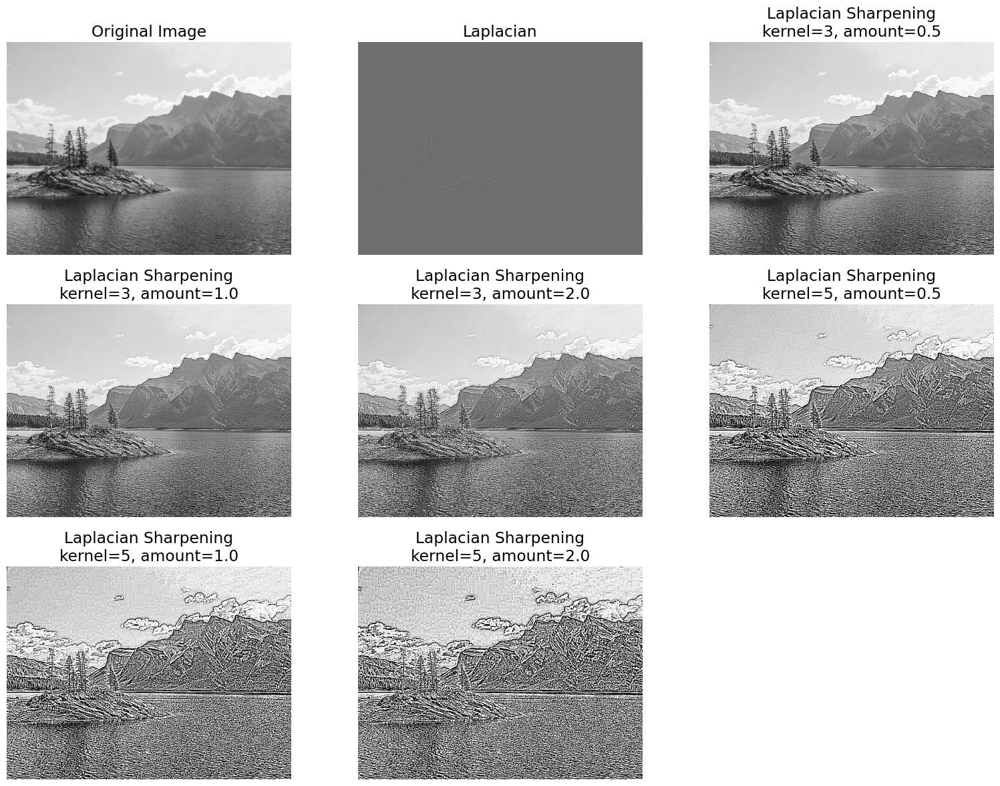

In [17]:
def laplacian_sharpening(image, kernel_size=3, amount=1.0):
    """Apply Laplacian sharpening to an image"""
    # Compute the Laplacian
    laplacian = cv2.Laplacian(image, cv2.CV_64F, ksize=kernel_size)
    
    # For sharpening, we subtract the Laplacian from the original
    # (Note the negative sign, since the Laplacian kernel has negative center)
    sharpened = image.astype(np.float64) - amount * laplacian
    
    # Clip values to the valid range and convert back to uint8
    sharpened = np.clip(sharpened, 0, 255).astype(np.uint8)
    
    return sharpened, laplacian

# Apply Laplacian sharpening with different parameters
kernel_sizes = [3, 5]
amounts = [0.5, 1.0, 2.0]

# Store the results for different parameter combinations
sharpened_results = []
for ksize in kernel_sizes:
    for amount in amounts:
        sharpened, laplacian = laplacian_sharpening(gray_image, kernel_size=ksize, amount=amount)
        sharpened_results.append((ksize, amount, sharpened))

# Display a selection of results
plt.figure(figsize=(16, 12))

# Original image
plt.subplot(3, 3, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Laplacian of the image
plt.subplot(3, 3, 2)
laplacian_displayed = normalize_for_display(cv2.Laplacian(gray_image, cv2.CV_64F))
plt.imshow(laplacian_displayed, cmap='gray')
plt.title('Laplacian')
plt.axis('off')

# Sharpened images with different parameters
for i, (ksize, amount, sharpened) in enumerate(sharpened_results[:7]):
    plt.subplot(3, 3, i+3)
    plt.imshow(sharpened, cmap='gray')
    plt.title(f'Laplacian Sharpening\nkernel={ksize}, amount={amount}')
    plt.axis('off')

plt.tight_layout()
plt.show()


The Laplacian sharpening operation works by:
1. Computing the Laplacian of the image, which highlights areas of rapid intensity change
2. Subtracting this Laplacian from the original image (note: we subtract because the center of the Laplacian kernel is negative)
3. This enhances edges and fine details, making the image appear sharper


### 6.3 High-Boost Filtering

High-boost filtering is a generalization of unsharp masking. It enhances high-frequency components (edges and details) while preserving some of the low-frequency components (overall structure).

The high-boost filtering equation is:

$$g(x,y) = A \cdot f(x,y) - f_{blur}(x,y)$$

or equivalently:

$$g(x,y) = (A-1) \cdot f(x,y) + f(x,y) - f_{blur}(x,y)$$

Where:
- $f(x,y)$ is the original image
- $f_{blur}(x,y)$ is the blurred image
- $A$ is the boost factor (when $A = 1$, this becomes standard unsharp masking)
- $g(x,y)$ is the sharpened image

Let's implement high-boost filtering:

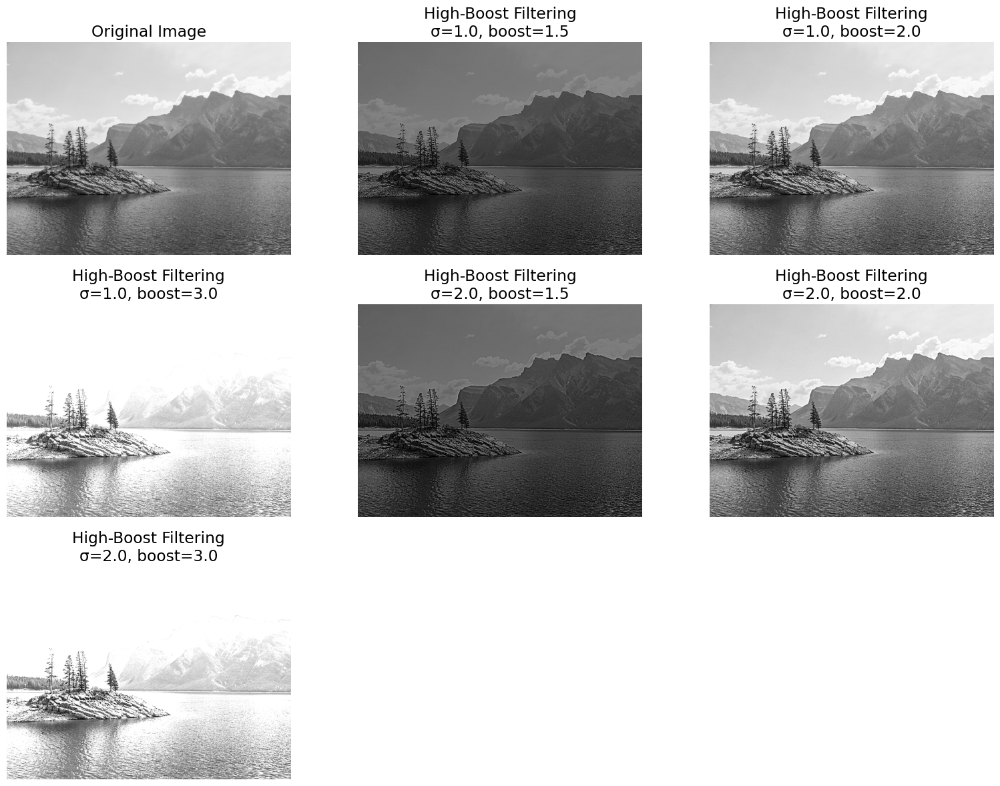

In [18]:
def high_boost_filtering(image, sigma=1.0, boost_factor=2.0):
    """Apply high-boost filtering to an image"""
    # Create the blurred version of the image
    blurred = cv2.GaussianBlur(image, (0, 0), sigma)
    
    # Apply high-boost filtering
    # g(x,y) = A * f(x,y) - f_blur(x,y)
    high_boost = boost_factor * image.astype(np.float32) - blurred.astype(np.float32)
    
    # Clip values to the valid range
    high_boost = np.clip(high_boost, 0, 255).astype(np.uint8)
    
    return high_boost, blurred

# Apply high-boost filtering with different parameters
sigma_values = [1.0, 2.0]
boost_factors = [1.5, 2.0, 3.0]

# Store the results for different parameter combinations
high_boost_results = []
for sigma in sigma_values:
    for boost in boost_factors:
        high_boost, _ = high_boost_filtering(gray_image, sigma=sigma, boost_factor=boost)
        high_boost_results.append((sigma, boost, high_boost))

# Display the results
plt.figure(figsize=(16, 12))

# Original image
plt.subplot(3, 3, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# High-boost filtered images
for i, (sigma, boost, high_boost) in enumerate(high_boost_results):
    plt.subplot(3, 3, i+2)
    plt.imshow(high_boost, cmap='gray')
    plt.title(f'High-Boost Filtering\nσ={sigma}, boost={boost}')
    plt.axis('off')

plt.tight_layout()
plt.show()

### 6.4 Frequency Domain Sharpening

We can also perform sharpening in the frequency domain by enhancing high-frequency components. This approach gives us fine-grained control over which frequencies are enhanced.

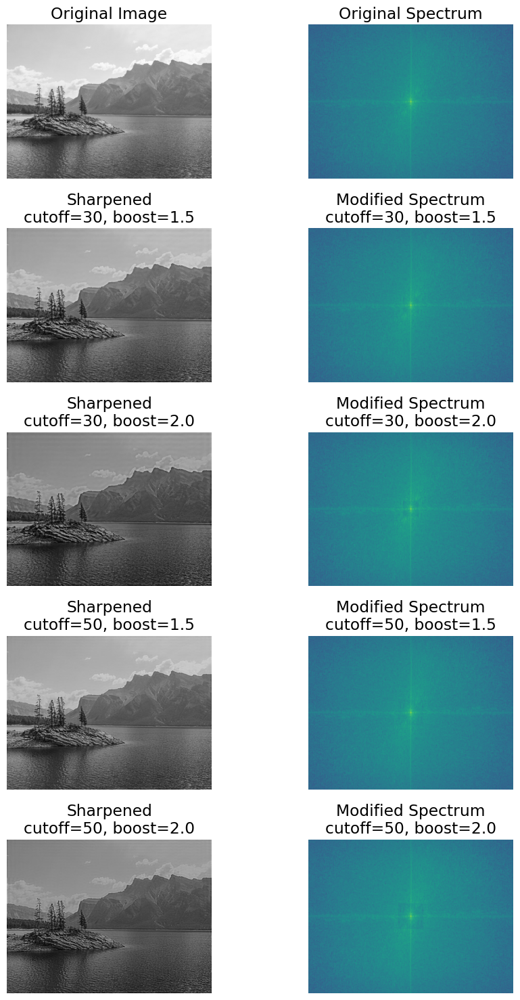

In [19]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def normalize_for_display(image):
    """Normalize the image to the 0–255 range and convert to uint8."""
    image = image - np.min(image)
    image = image / np.max(image) * 255
    return image.astype(np.uint8)

def frequency_domain_sharpening(image, cutoff=30, boost=2.0):
    """Apply frequency domain sharpening using a high-boost filter.
    
    Low frequencies (center) remain unchanged, while high frequencies are amplified.
    """
    # Compute the 2D FFT of the image and shift the zero frequency to the center
    f_transform = np.fft.fft2(image)
    f_shift = np.fft.fftshift(f_transform)
    
    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2
    
    # Create a high-boost filter mask:
    # Multiply high frequencies (outside the central low-frequency region) by 'boost',
    # while leaving the low frequencies (center) unchanged.
    mask = np.ones((rows, cols), np.float32) * boost
    mask[crow-cutoff:crow+cutoff, ccol-cutoff:ccol+cutoff] = 1.0
    
    # Apply the mask in the frequency domain
    f_shift_sharpened = f_shift * mask
    
    # Compute the inverse FFT to return to the spatial domain
    f_ishift = np.fft.ifftshift(f_shift_sharpened)
    img_back = np.fft.ifft2(f_ishift)
    img_sharpened = np.abs(img_back)
    
    # Normalize for display
    img_sharpened = normalize_for_display(img_sharpened)
    
    # Compute magnitude spectra (log scale for better visualization)
    orig_spectrum = 20 * np.log10(np.abs(f_shift) + 1)
    sharp_spectrum = 20 * np.log10(np.abs(f_shift_sharpened) + 1)
    
    return img_sharpened, orig_spectrum, sharp_spectrum

# Assume gray_image is already defined (e.g., via cv2.imread in grayscale)
# gray_image = cv2.imread('path_to_image', cv2.IMREAD_GRAYSCALE)

# Parameters to try
cutoff_values = [30, 50]
boost_values = [1.5, 2.0]

# Process the image with different parameters
freq_sharpening_results = []
for cutoff in cutoff_values:
    for boost in boost_values:
        sharpened, orig_spectrum, sharp_spectrum = frequency_domain_sharpening(
            gray_image, cutoff=cutoff, boost=boost)
        freq_sharpening_results.append((cutoff, boost, sharpened, orig_spectrum, sharp_spectrum))

# Display results using a grid of 5 rows x 2 columns
plt.figure(figsize=(10, 15))

# Row 1: Original image and its spectrum
plt.subplot(5, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(5, 2, 2)
plt.imshow(freq_sharpening_results[0][3], cmap='viridis')
plt.title('Original Spectrum')
plt.axis('off')

# Rows 2-5: Sharpened images and their modified spectra
for i, (cutoff, boost, sharpened, _, sharp_spectrum) in enumerate(freq_sharpening_results):
    plt.subplot(5, 2, 3 + 2*i)
    plt.imshow(sharpened, cmap='gray')
    plt.title(f'Sharpened\ncutoff={cutoff}, boost={boost}')
    plt.axis('off')
    
    plt.subplot(5, 2, 4 + 2*i)
    plt.imshow(sharp_spectrum, cmap='viridis')
    plt.title(f'Modified Spectrum\ncutoff={cutoff}, boost={boost}')
    plt.axis('off')

plt.tight_layout()
plt.show()


Each sharpening technique has its strengths and weaknesses:

1. **Unsharp Masking**: Simple and effective for most applications. Provides a good balance between enhancement and noise.

2. **Laplacian Sharpening**: Provides strong edge enhancement but can amplify noise significantly. Works well for images with low noise.

3. **High-Boost Filtering**: Offers more control over the sharpening effect by preserving more of the original image. Good for subtle enhancements.

4. **Frequency Domain Sharpening**: Provides the most precise control over which frequencies are enhanced. Useful for targeted enhancements but can introduce ringing artifacts.

> **Common Pitfall**: Over-sharpening can introduce unwanted artifacts like halos around edges or amplify noise. Always balance the amount of sharpening with the image quality and noise level.


### 7.1 Understanding the Pipeline

Our coin detection pipeline demonstrates how different image processing techniques can be combined to solve a real-world problem. Here's what each step accomplishes:

1. **Gaussian Blur**: Reduces noise while preserving edges, making subsequent steps more reliable.

2. **CLAHE Enhancement**: Improves contrast locally, which helps in distinguishing coins from the background.

3. **Laplacian Sharpening**: Enhances edges and fine details, making the boundaries of coins more distinct.

4. **Thresholding**: Converts the grayscale image to binary, separating coins from the background.

5. **Morphological Operations**: Cleans up the binary image by removing small noise artifacts and filling holes.

6. **Contour Detection**: Identifies the boundaries of potential coins.

7. **Filtering by Area**: Removes small contours that are likely to be noise rather than coins.

8. **Visualization**: Draws the detected coins on the original image and labels them with their approximate diameters.

### 7.2 Discussion and Improvement Ideas

While our pipeline works well for the sample image, it can be further improved:

1. **Handling Overlapping Coins**: Our current approach struggles with overlapping coins. Techniques like the watershed algorithm could help separate them.

2. **Coin Classification**: We could enhance the pipeline to classify coins by size or other features.

3. **Lighting Invariance**: Additional preprocessing steps could make the detection more robust to varying lighting conditions.

4. **Parameter Tuning**: The parameters used in each step (blur size, CLAHE parameters, morphological kernel size, etc.) could be optimized for better results.
